### **Positive reviews**

In [1]:
%%capture
!pip install -r ../requirements.txt

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns 
import plotly.express as px
import unicodedata
import fasttext
import re
import nltk
import pickle
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
from wordcloud import WordCloud

In [3]:
# Created using create_df_sentences.py
df_sentences_4_stars = pd.read_csv('../data/interim/sentences_4_stars.csv')
df_sentences_5_stars = pd.read_csv('../data/interim/sentences_5_stars.csv')

In [4]:
df_positive_sentences = pd.concat([df_sentences_4_stars, df_sentences_5_stars])

In [6]:
tfile = open('positive_sentences.txt', 'a')
tfile.write(df_positive_sentences['text_processed'].to_string())
tfile.close()

In [7]:
model = fasttext.train_unsupervised('positive_sentences.txt')

Read 0M words
Number of words:  6136
Number of labels: 0
Progress: 100.0% words/sec/thread:   50799 lr:  0.000000 avg.loss:  2.330114 ETA:   0h 0m 0s


In [8]:
df_positive_sentences['vec'] = df_positive_sentences['text_processed'].apply(lambda x: model.get_sentence_vector(str(x)))

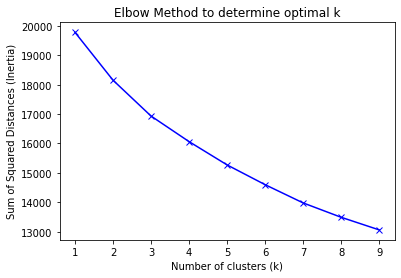

In [9]:
sum_squared_distances = []

K = range(1,10)
for num_clusters in K :
    kmeans = KMeans(n_clusters=num_clusters)
    kmeans.fit(df_positive_sentences['vec'].values.tolist())
    sum_squared_distances.append(kmeans.inertia_)

plt.plot(K, sum_squared_distances, 'bx-')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Sum of Squared Distances (Inertia)')
plt.title('Elbow Method to determine optimal k')
plt.show()

In [11]:
kmeans = KMeans(n_clusters=3)

In [28]:
df_positive_sentences['cluster'] = kmeans.fit_predict(df_positive_sentences['vec'].values.tolist())

In [14]:
def generate_wordcloud(df):
    text = ' '.join([str(i) for i in df['text_processed']])
    wordcloud = WordCloud(max_words=100, background_color='Black').generate(text)
    plt.figure(figsize=(12,12))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.show()

##### **Cluster 0**

In [47]:
cluster_0 = df_positive_sentences[df_positive_sentences['cluster']==0]

In [54]:
cluster_0.sample(5)

,text,review_index,text_processed,vec,cluster
12682,"El hostal es precioso, y las camas muy cómodas...",2209,hostal precioso camas comodas caso privada ban...,"[-0.0522224, 0.041609563, -0.03984801, 0.01673...",0
3769,El personal no puede ser más atento ni más agr...,693,personal no puede ser atento agradable momento...,"[-0.005239542, 0.13993044, -0.024150684, 0.013...",0
11697,"La habitación genial, moderna, limpia, amplia ...",2031,habitacion genial moderna limpia amplia colcho...,"[-0.0415654, -0.014367353, -0.047239494, 0.032...",0
22636,El trato del personal fue bastante bueno y pro...,3849,trato personal bastante bueno profesional,"[-0.02231806, 0.11068348, -0.09637796, 0.01237...",0
5789,"PEQUEÑO, EXCELENTE CALIDAD PRECIO",1051,pequeno excelente calidad precio,"[-0.030347, 0.07820535, -0.120603144, 0.003809...",0


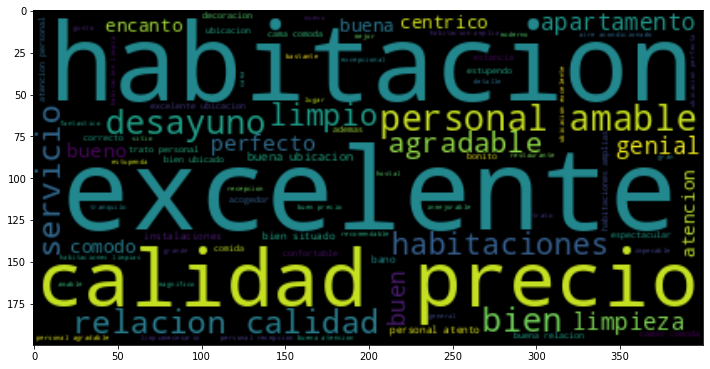

In [51]:
generate_wordcloud(cluster_0)

In [55]:
df_positive_sentences.loc[df_positive_sentences['cluster']==0, 'cluster'] = 'price and service'

In [56]:
n_sentences_c0 = len(cluster_0)
n_sentences = len(df_positive_sentences)
n_comments_c0 = cluster_0['review_index'].nunique()
n_comments = df_positive_sentences['review_index'].nunique()
perc_sentences_c0 = round(100*(n_sentences_c0/n_sentences))
perc_comments_c0 = round(100*(n_comments_c0/n_comments))

In [57]:
print(f'Total number of sentences (all clusters): {n_sentences}')
print(f'Number of sentences belonging to cluster 0: {n_sentences_c0}')
print(f'Percentage of sentences belonging to cluster 0: {perc_sentences_c0}')
print(f'Total number of comments: {n_comments}')
print(f'Number of comments that include sentences belonging to cluster 0: {n_comments_c0}')
print(f'Percentage of comments that include sentences belonging to cluster 0: {perc_comments_c0}')

Total number of sentences (all clusters): 78563
Number of sentences belonging to cluster 0: 28701
Percentage of sentences belonging to cluster 0: 37
Total number of comments: 9005
Number of comments that include sentences belonging to cluster 0: 8254
Percentage of comments that include sentences belonging to cluster 0: 92


##### **Cluster 1**

In [ ]:
cluster_1 = df_positive_sentences[df_positive_sentences['cluster']==1]

In [43]:
cluster_1.sample(5)

,text,review_index,text_processed,vec,cluster
11357,"he vuelto, esta vez acompañando a una pareja d...",2027,vuelto vez acompanando pareja amigos italianos,"[0.0022773116, 0.17637071, -0.09634635, 0.0193...",1
22251,"Ubicación a 5 minutos andando del centro, la ...",3943,ubicacion 5 minutos andando centro calle paral...,"[-0.07274525, 0.06539245, -0.09775778, 0.09665...",1
20852,La calle Elvira para tapear se encuentra a esc...,3697,calle elvira tapear encuentra escasos metros 1...,"[-0.09765123, 0.088822864, -0.08883022, 0.0860...",1
38813,Su refugio es aún joven y sólo hay algunas reg...,6791,refugio aun joven solo reglas mantener buen fu...,"[-0.022037098, 0.114779785, -0.032809593, 0.03...",1
9239,Y gran surtido de bares para tapear,1613,gran surtido bares tapear,"[-0.08383276, 0.069290206, -0.09982426, 0.0684...",1


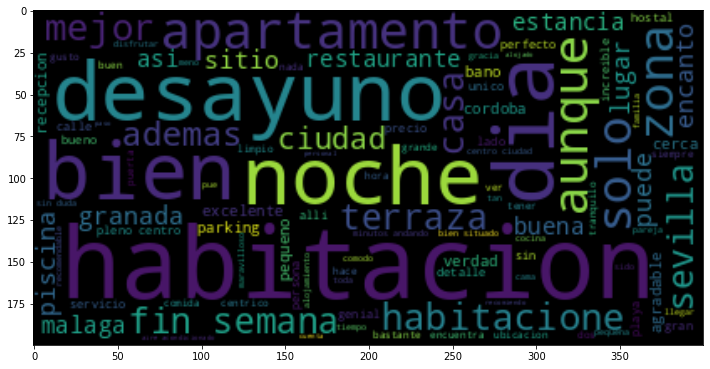

In [44]:
generate_wordcloud(cluster_1)

In [58]:
df_positive_sentences.loc[df_positive_sentences['cluster']==1, 'cluster'] = 'general experience'

In [45]:
n_sentences_c1 = len(cluster_1)
n_comments_c1 = cluster_1['review_index'].nunique()
perc_sentences_c1 = round(100*(n_sentences_c1/n_sentences))
perc_comments_c1 = round(100*(n_comments_c1/n_comments))

In [46]:
print(f'Total number of sentences (all clusters): {n_sentences}')
print(f'Number of sentences belonging to cluster 1: {n_sentences_c1}')
print(f'Percentage of sentences belonging to cluster 1: {perc_sentences_c1}')
print(f'Total number of comments: {n_comments}')
print(f'Number of comments that include sentences belonging to cluster 1: {n_comments_c1}')
print(f'Percentage of comments that include sentences belonging to cluster 1: {perc_comments_c1}')

Total number of sentences (all clusters): 78563
Number of sentences belonging to cluster 1: 42807
Percentage of sentences belonging to cluster 1: 54
Total number of comments: 9005
Number of comments that include sentences belonging to cluster 1: 8770
Percentage of comments that include sentences belonging to cluster 1: 97


##### **Cluster 2**

In [ ]:
cluster_2 = df_positive_sentences[df_positive_sentences['cluster']==2]

In [35]:
cluster_2.sample(5)

,text,review_index,text_processed,vec,cluster
5738,Segunda vez que estoy y otro acierto,1032,segunda vez acierto,"[0.0058598854, 0.06993393, 0.0048126797, 0.012...",2
4131,RECOMENDABLE,752,recomendable,"[0.039616015, 0.16146886, -0.21749562, 0.01576...",2
5647,Volveré…,1023,volvere,"[0.08518317, 0.1397506, -0.07149016, -0.023297...",2
6225,Siempre que estoy en Sevilla me quedo en Ibis ...,1121,siempre sevilla quedo ibis sevilla,"[-0.012811938, 0.11807729, -0.09161237, 0.0649...",2
1030,Repetiría,195,repetiria,"[0.03990125, 0.062267095, -0.076018795, 0.0134...",2


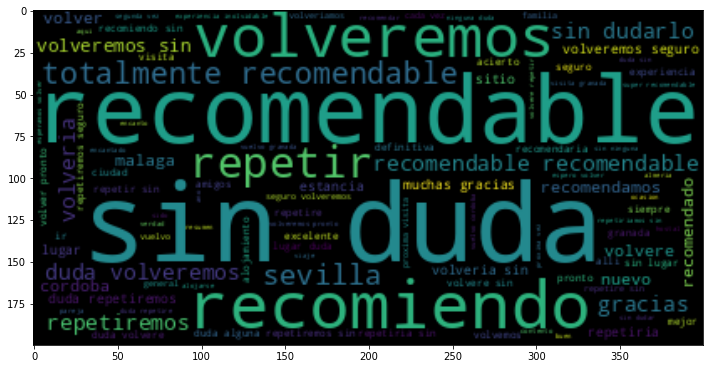

In [36]:
generate_wordcloud(cluster_2)

In [37]:
df_positive_sentences.loc[df_positive_sentences['cluster']==2, 'cluster'] = 'recommendation'

In [38]:
n_sentences_c2 = len(cluster_2)
n_comments_c2 = cluster_2['review_index'].nunique()
perc_sentences_c2 = round(100*(n_sentences_c2/n_sentences))
perc_comments_c2 = round(100*(n_comments_c2/n_comments))

In [39]:
print(f'Total number of sentences (all clusters): {n_sentences}')
print(f'Number of sentences belonging to cluster 2: {n_sentences_c2}')
print(f'Percentage of sentences belonging to cluster 2: {perc_sentences_c2}')
print(f'Total number of comments: {n_comments}')
print(f'Number of comments that include sentences belonging to cluster 2: {n_comments_c2}')
print(f'Percentage of comments that include sentences belonging to cluster 2: {perc_comments_c2}')

Total number of sentences (all clusters): 78563
Number of sentences belonging to cluster 2: 7055
Percentage of sentences belonging to cluster 2: 9
Total number of comments: 9005
Number of comments that include sentences belonging to cluster 2: 5088
Percentage of comments that include sentences belonging to cluster 2: 57


About 9% of positive sentences mention the possibility of recommending or revisiting the hotel. These sentences (6746 in total) are present in 4949 review comments with 4 or 5 stars (out of 9005), which means that about 57% of positive review comments include mentions of the possibility of recommending or revisiting the hotel.

In [59]:
df_positive_sentences.to_csv('../data/processed/positive_sentences_clusters.csv')

##### **Comments and sentences distribution**

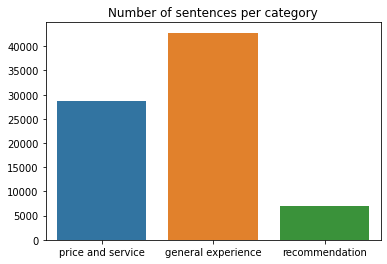

In [68]:
sentences_clusters = ['price and service', 'general experience', 'recommendation']
n_sentences = [n_sentences_c0, n_sentences_c1, n_sentences_c2]
sns.barplot(x=sentences_clusters, y=n_sentences)
plt.title('Number of sentences per category')
plt.show()

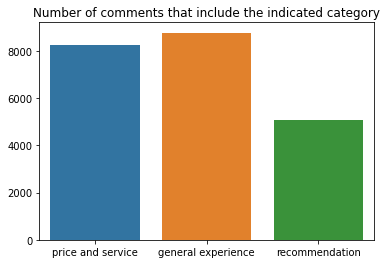

In [67]:
n_comments = [n_comments_c0, n_comments_c1, n_comments_c2]
sns.barplot(x=sentences_clusters, y=n_comments)
plt.title('Number of comments that include the indicated category')
plt.show()

##### **Clusters visualization**

In [60]:
# Main components to make 3D plot
pca = PCA(n_components=3)
df_positive_sentences['x'] = pca.fit_transform(df_positive_sentences['vec'].values.tolist())[:,0]
df_positive_sentences['y'] = pca.fit_transform(df_positive_sentences['vec'].values.tolist())[:,1]
df_positive_sentences['z'] = pca.fit_transform(df_positive_sentences['vec'].values.tolist())[:,2]

In [61]:
df_positive_sentences['cluster'] = df_positive_sentences['cluster'].astype('category')

In [62]:
fig = px.scatter_3d(df_positive_sentences, x='x', y='y', z='z', color='cluster')
fig.update_traces(marker_size = 2)
fig.show()

Reference:
https://towardsdatascience.com/making-sense-of-text-clustering-ca649c190b20#:~:text=For%20a%20refresh%2C%20clustering%20is,learn%20the%20pattern%20by%20itself.